# Análisis Exploratorio 2

Exploración luego de corregir datos y creación de nuevas variables.

Al comienzo se realiza un análisis preliminar automatizado que se puede encontrar en ``eda_reporte_02-preliminar.html``.  

Se sigue con una exploración general,  

y a continuación se realizan análisis enfocados en los entrenamientos que se realizarán con XGBoost.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
sns.set_palette("colorblind")

# %matplotlib inline
# import matplotlib
# matplotlib.use("pgf")
# matplotlib.rcParams.update({
#     "pgf.texsystem": "pdflatex",
#     'font.family': 'serif',
#     'text.usetex': True,
#     'pgf.rcfonts': False,
# })
import matplotlib.pyplot as plt
plt.rcParams['font.size'] = 10
# plt.rcdefaults # Restore the standard Matplotlib default settings

from ydata_profiling import ProfileReport

# Flag for showing plots or saving to pgf
show = 0

In [2]:
df = pd.read_csv("../datos/dataset_02-feateng.csv")
df['SEDE'] = df['SEDE'].astype('category')
df['sala'] = df['sala'].astype('category')
df['MATERIA'] = df['MATERIA'].astype('category')
df['cuat'] = df['cuat'].astype('category')
df['codCarrera'] = df['codCarrera'].astype('category')
df['facultad'] = df['facultad'].astype('category')
df['extranjero'] = df['extranjero'].astype('category')
df['edad'] = df['edad'].astype('category')
df['turno'] = df['turno'].astype('category')
df['recurso'] = df['recurso'].astype('category')
df['condición'] = df['condición'].astype('category')
print("Cantidad de observaciones:", len(df))
df.info()

Cantidad de observaciones: 233615
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 233615 entries, 0 to 233614
Data columns (total 30 columns):
 #   Column       Non-Null Count   Dtype   
---  ------       --------------   -----   
 0   anio         233615 non-null  int64   
 1   cuat         233615 non-null  category
 2   SEDE         233615 non-null  category
 3   MATERIA      233615 non-null  category
 4   pa1          111741 non-null  float64 
 5   pa2          81307 non-null   float64 
 6   Final        18428 non-null   float64 
 7   codCarrera   233615 non-null  category
 8   facultad     233615 non-null  category
 9   rem1         5107 non-null    float64 
 10  rem2         1608 non-null    float64 
 11  estudiante   233615 non-null  int64   
 12  extranjero   233615 non-null  category
 13  curso        233615 non-null  int64   
 14  turno        233615 non-null  category
 15  n_alum       233615 non-null  int64   
 16  p_ext        233615 non-null  float64 
 17  recurso      2

In [3]:
# Descomentar para generar el reporte preliminar en html
# df_valido = df.loc[(df['valido1']==1) & (df['valido2']==1)].copy()
# df_valido = df_valido.drop(['valido1', 'valido2'], axis=1)
# profile = ProfileReport(df_valido, title="Análisis exploratorio 2 inicial - Solo cursos válidos")
# profile.to_file("eda_reporte_02-preliminar.html")

## Exploración general

In [4]:
################################################
#
# Cantidad de alumnos
#
# por sede, por materia
# extranjeros por sede
# por turno por sede
#
################################################

# Ordeno las sedes por cantidad total de estudiantes
df['SEDE'] = df['SEDE'].astype('str')
df['MATERIA'] = df['MATERIA'].astype('str')

materias1 = df.groupby(by=['SEDE'], as_index = False).size()
materias1.columns = ['SEDE', 'total']
materias1.sort_values(by='total', ascending=False, ignore_index=True, inplace=True)
materias2 = df.groupby(by=['SEDE','MATERIA'], as_index = False).size()
materias2 = materias2.pivot(index='SEDE', columns='MATERIA', values='size')
materias = pd.merge(
    materias1,
    materias2,
    how="outer",
    on='SEDE',
)
materias.fillna(value=0, inplace=True)
materias = materias.astype('int')
materias['SEDE'] = materias['SEDE'].astype('str')
materias
# Hay SEDES principales con muchos estudiantes, y el resto con muchos menos estudiantes.

,SEDE,total,3,53
0,2,50086,19694,30392
1,10,36149,3755,32394
2,4,35809,8589,27220
3,1,34617,9653,24964
4,5,25840,7227,18613
5,6,20247,6945,13302
6,15,7203,7203,0
7,33,4092,1262,2830
8,32,3872,92,3780
9,28,3569,457,3112


In [5]:
################################################
#
# Se analizan las sedes más grandes
#
# Cuando se incluyan notas, se realizará un análisis
# nuevo incluyendo las otras sedes.
#
################################################

In [6]:
principales = materias[0:6]

df2 = df[df['SEDE'].isin(['1', '2', '4', '5', '6', '10'])]
print("Cantidad de registros en las sedes más grandes: ",len(df2))

Cantidad de registros en las sedes más grandes:  202748


In [7]:
extranjeros = df2.groupby(by=['SEDE','extranjero'], as_index = False).size()
extranjeros = extranjeros.pivot(index='SEDE', columns='extranjero', values='size')
extranjeros.columns = ['No', 'Sí']
# Ordeno los registros de mayor a menor cantidad de estudiantes
extranjeros = pd.merge(
    principales.SEDE,
    extranjeros,
    how="outer",
    on='SEDE',
)
extranjeros

,SEDE,No,Sí
0,2,39612,10474
1,10,32172,3977
2,4,33791,2018
3,1,25994,8623
4,5,22714,3126
5,6,18959,1288


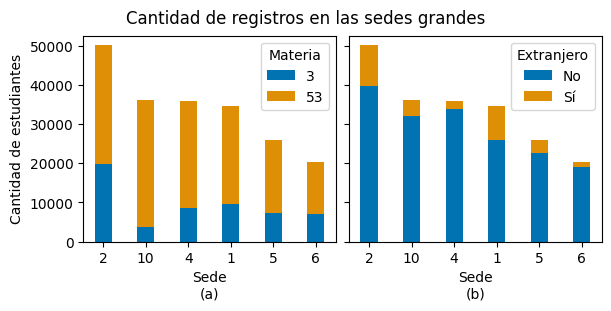

In [8]:
sedes = principales['SEDE'].values
mat = {
    "3": np.array(principales['3'].values),
    "53": np.array(principales['53'].values),
}
width = 0.4

fig, ax = plt.subplots(1, 2, figsize=(9, 3), sharey=True, layout='constrained')
bottom = np.zeros(6)

for boolean, cant in mat.items():
    p = ax[0].bar(sedes, cant, width, label=boolean, bottom=bottom)
    bottom += cant

ax[0].set_xlabel("Sede\n(a)")
ax[0].legend(loc="upper right", title='Materia')

ext = {
    "No": np.array(extranjeros['No'].values),
    "Sí": np.array(extranjeros['Sí'].values),
}

bottom = np.zeros(6)
for boolean, cant in ext.items():
    p = ax[1].bar(sedes, cant, width, label=boolean, bottom=bottom)
    bottom += cant

ax[1].set_xlabel("Sede\n(b)")
ax[1].legend(loc="upper right", title='Extranjero')

ax[0].set_ylabel('Cantidad de estudiantes')
fig.suptitle('Cantidad de registros en las sedes grandes')

if show:
    fig.set_size_inches(w=6, h=2.9)
    plt.show()
else:
    fig.set_size_inches(w=6, h=3)
    plt.savefig('../img/eda_02_sedes-nalum.pgf')

Son categorías muy desbalanceadas, algo a tener en cuenta al analizar resultados. 

In [9]:
porturno = df2.groupby(by=['SEDE','turno'], as_index = False).size()
porturno = porturno.pivot(index='SEDE', columns='turno', values='size')
# extranjeros.columns = ['No', 'Sí']
# Ordeno los registros de mayor a menor cantidad de estudiantes
porturno = pd.merge(
    principales.SEDE,
    porturno,
    how="outer",
    on='SEDE',
)
porturno


,SEDE,A,B,C,D
0,2,13695,13218,18761,4412
1,10,7813,10239,13871,4226
2,4,9434,9912,12725,3738
3,1,9487,10873,10281,3976
4,5,7843,6879,7972,3146
5,6,5454,5149,6915,2729


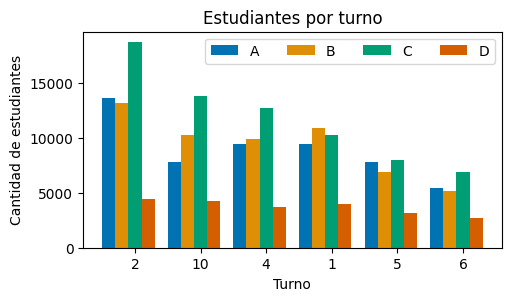

In [10]:
portu = {
    'A': np.array(porturno['A'].values),
    'B': np.array(porturno['B'].values),
    'C': np.array(porturno['C'].values),
    'D': np.array(porturno['D'].values),
}

x = np.arange(len(sedes)) # the label locations
# x = [1, 3, 5, 7, 9, 11]
width = 0.2  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(figsize=(4.5, 3), layout='constrained')

for attribute, measurement in portu.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=attribute)
    # ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Cantidad de estudiantes')
ax.set_xlabel('Turno')
ax.set_xticks(x + 2*width, sedes)
ax.legend(loc='upper right', ncols=4)
ax.set_title('Estudiantes por turno')
# ax.set_ylim(0, 250)

if show:
    plt.show()
else:
    fig.set_size_inches(w=5, h=2.9)
    plt.savefig('../img/eda_02_sedes-turno.pgf')

In [11]:
################################################
#
# Notas
#
# Solo en los cursos válidos.
#
################################################

In [12]:
validos = df.groupby(by=['SEDE', 'valido1', 'curso'], as_index = False).size()
validos = validos[['SEDE', 'valido1', 'curso']].groupby(by=['SEDE', 'valido1'], as_index = False).size()
validos = validos.pivot(index='SEDE', columns='valido1', values='size')
validos.fillna(value=0, inplace=True)
# Ordeno los registros de mayor a menor cantidad de estudiantes
validos = pd.merge(
    materias.SEDE,
    validos,
    how="outer",
    on='SEDE',
)
validos.astype(int)


,SEDE,0,1
0,2,12,481
1,10,91,233
2,4,169,216
3,1,32,355
4,5,132,203
5,6,76,140
6,15,28,57
7,33,40,8
8,32,31,11
9,28,14,58


Hay sedes con muy pocos cursos.

In [13]:
# Creo una categoría por anio-cuat
df['cuatrimestre'] = df["anio"].astype(str) + "-" + df["cuat"].astype(str)
validos = df.groupby(by=['SEDE', 'cuatrimestre', 'valido1', 'curso'], as_index = False).size()
validos = validos[['SEDE', 'cuatrimestre', 'valido1', 'curso']].groupby(by=['SEDE', 'cuatrimestre', 'valido1'], as_index = False).size()
validos.sample(5)

,SEDE,cuatrimestre,valido1,size
240,38,2015-1,0,2
323,5,2019-1,1,16
89,15,2018-2,1,16
90,15,2019-1,1,1
337,6,2014-1,1,7


In [14]:
validos1 = df.loc[df['valido1'] == 1].copy()
validos2 = df.loc[df['valido2'] == 1].copy()
print("Cantidad de registros con pa1 válidos: ", len(validos1))
print("Cantidad de registros con pa2 válidos: ", len(validos2))

Cantidad de registros con pa1 válidos:  167589
Cantidad de registros con pa2 válidos:  159120


In [15]:
# Dataframe para generar los histogramas
# Sedes donde cursaron menos de 1000 estudiantes.
pequenias = materias['SEDE'][13:-1].values
# Notas de parcial 1.
notas1 = validos1[['SEDE', 'pa1']].copy()
# Se agrupan las sedes pequeñas en el código 99
notas1.loc[notas1['SEDE'].isin(pequenias), 'SEDE'] = 99
notas1 = notas1.pivot(columns='SEDE')
notas1 = notas1['pa1']
# Promedio de notas de parciales.
validos2['promedio'] = (validos2['pa1'] + validos2['pa2'])/2
notasprom = validos2[['SEDE', 'promedio']].copy()
# Se agrupan las sedes pequeñas en el código 99
notasprom.loc[notasprom['SEDE'].isin(pequenias), 'SEDE'] = 99
notasprom = notasprom.pivot(columns='SEDE')
notasprom = notasprom['promedio']

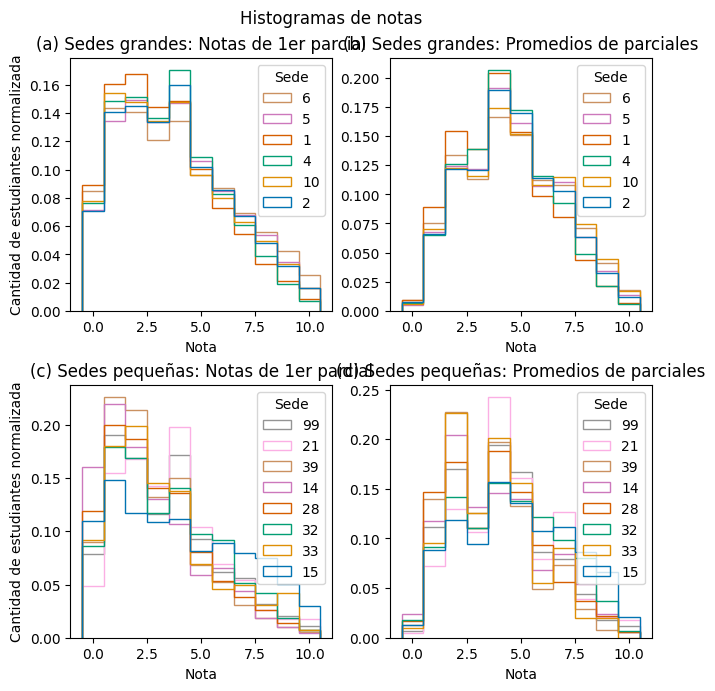

In [16]:
n_bins = 11

fig, ax = plt.subplots(2, 2, figsize=(9, 7), sharey=False, layout='constrained')

cols = materias['SEDE'][0:6].values
x = notas1[cols]
ax[0,0].hist(x, n_bins, range=(-0.5,10.5), histtype='step', density=True, 
        fill=False, label=cols)
ax[0,0].legend(prop={'size': 10}, title='Sede')
ax[0,0].set_ylabel('Cantidad de estudiantes normalizada')
ax[0,0].set_xlabel('Nota')
ax[0,0].set_title('(a) Sedes grandes: Notas de 1er parcial')

x = notasprom[cols]
ax[0,1].hist(x, n_bins, range=(-0.5,10.5), histtype='step', density=True, 
        fill=False, label=cols)
ax[0,1].legend(prop={'size': 10}, title='Sede', loc='upper right', ncols=1)
ax[0,1].set_xlabel('Nota')
ax[0,1].set_title('(b) Sedes grandes: Promedios de parciales')

cols = materias['SEDE'][6:13].values
cols = np.concatenate([cols,[99]])
x = notas1[cols]
ax[1,0].hist(x, n_bins, range=(-0.5,10.5), histtype='step', density=True, 
        fill=False, label=cols)
ax[1,0].legend(prop={'size': 10}, title='Sede')
ax[1,0].set_ylabel('Cantidad de estudiantes normalizada')
ax[1,0].set_xlabel('Nota')
ax[1,0].set_title('(c) Sedes pequeñas: Notas de 1er parcial')

x = notasprom[cols]
ax[1,1].hist(x, n_bins, range=(-0.5,10.5), histtype='step', density=True, 
        fill=False, label=cols)
ax[1,1].legend(prop={'size': 10}, title='Sede', loc='upper right', ncols=1)
ax[1,1].set_xlabel('Nota')
ax[1,1].set_title('(d) Sedes pequeñas: Promedios de parciales')

fig.suptitle('Histogramas de notas')

if show:
    plt.show()
else:
    fig.set_size_inches(w=6.5, h=6.8)
    plt.savefig('../img/eda_02_hist-notas.pgf')

In [17]:
################################################
#
# Condición
#
# Solo en los cursos válidos.
#
################################################

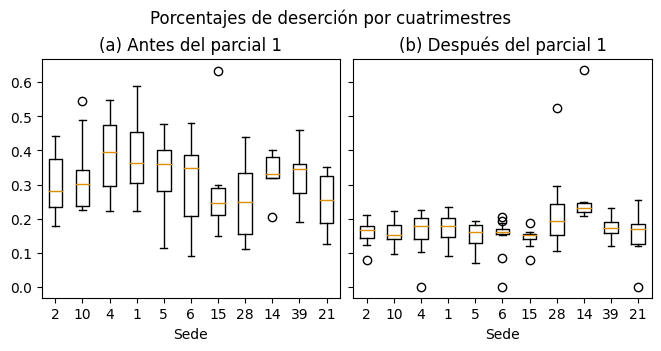

In [18]:
# Sedes que se analizan en este caso, algunas se descartan por pocos registros.
# Ordenadas de mayor a menor número de estudiantes.
se = ['2', '10', '4', '1', '5', '6', '15', '28', '14', '39', '21']

x1 = [np.array(
    validos1.loc[(validos1['SEDE']==s) & (validos1['condición']=='Abandona1')].groupby(by=['cuatrimestre']).size().values /
    validos1.loc[validos1['SEDE']==s].groupby(by=['cuatrimestre']).size().values
    ) for s in se]

# Hay cuatrimestres con 0 registros en condición Abandona2, por eso el siguiente loop
x2 = []
for s in se:
    xx = np.array([])
    u = validos2.loc[validos2['SEDE']==s].groupby(by=['cuatrimestre'], as_index = False).size()
    t = validos2.loc[(validos2['SEDE']==s) & (validos2['condición']=='Abandona2')].groupby(by=['cuatrimestre'], as_index = False).size()
    for uu in u['cuatrimestre'].unique():
        tt = t.loc[t['cuatrimestre'] == uu]['size']
        if len(tt) > 0:
            xx = np.concatenate((xx,[tt.values[0] / u.loc[u['cuatrimestre'] == uu]['size'].values[0]]))
        else:
            xx = np.concatenate((xx,[0]))
    x2.append(xx)

labels = se

fig, ax = plt.subplots(1, 2, figsize=(9, 4), sharey=True, layout='constrained')

bplot1 = ax[0].boxplot(x1,
                     vert=True,  # vertical box alignment
                    #  patch_artist=True,  # fill with color
                     labels=labels)  # will be used to label x-ticks

bplot2 = ax[1].boxplot(x2,
                     vert=True,  # vertical box alignment
                    #  patch_artist=True,  # fill with color
                     labels=labels)  # will be used to label x-ticks


ax[0].set_ylabel('')
ax[0].set_xlabel('Sede')
ax[0].set_title('(a) Antes del parcial 1')

ax[1].set_xlabel('Sede')
ax[1].set_title('(b) Después del parcial 1')

fig.suptitle('Porcentajes de deserción por cuatrimestres')

if show:
    plt.show()
else:
    fig.set_size_inches(w=6.5, h=3.4)
    plt.savefig('../img/eda_02_box-desercion.pgf')

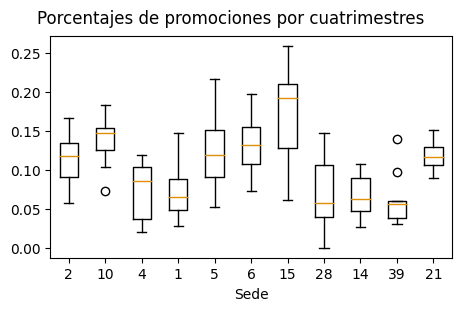

In [19]:
# Sedes que se analizan en este caso, algunas se descartan por pocos registros.
# Ordenadas de mayor a menor número de estudiantes.
se = ['2', '10', '4', '1', '5', '6', '15', '28', '14', '39', '21']

# Hay cuatrimestres con 0 registros en condición Abandona2, por eso el siguiente loop
x = []
for s in se:
    xx = np.array([])
    u = validos2.loc[validos2['SEDE']==s].groupby(by=['cuatrimestre'], as_index = False).size()
    t = validos2.loc[(validos2['SEDE']==s) & (validos2['condición']=='Promociona')].groupby(by=['cuatrimestre'], as_index = False).size()
    for uu in u['cuatrimestre'].unique():
        tt = t.loc[t['cuatrimestre'] == uu]['size']
        if len(tt) > 0:
            xx = np.concatenate((xx,[tt.values[0] / u.loc[u['cuatrimestre'] == uu]['size'].values[0]]))
        else:
            xx = np.concatenate((xx,[0]))
    x.append(xx)

labels = se

fig, ax = plt.subplots(figsize=(4.5, 4),layout='constrained')

bplot1 = ax.boxplot(x,
                     vert=True,  # vertical box alignment
                    #  patch_artist=True,  # fill with color
                     labels=labels)  # will be used to label x-ticks

ax.set_ylabel('')
ax.set_xlabel('Sede')
# ax.set_title('Antes del parcial 1')

fig.suptitle('Porcentajes de promociones por cuatrimestres')

if show:
    plt.show()
else:
    fig.set_size_inches(w=4.5, h=3)
    plt.savefig('../img/eda_02_box-promociones.pgf')

In [20]:
abandona1 = validos1.groupby(by=['SEDE', 'curso', 'abandona1_p'], as_index = False).size()
abandona1 = abandona1[['SEDE', 'abandona1_p']]
print(abandona1['SEDE'].unique())
print("ordenadas por cantidad de estudiantes:")
print(materias['SEDE'].values)

['1' '10' '13' '14' '15' '2' '21' '27' '28' '30' '31' '32' '33' '34' '35'
 '39' '4' '41' '42' '5' '6']
ordenadas por cantidad de estudiantes:
['2' '10' '4' '1' '5' '6' '15' '33' '32' '28' '14' '39' '21' '41' '34'
 '42' '38' '31' '35' '27' '30' '13' '37' '36']


In [21]:
abandona2 = validos2.groupby(by=['SEDE', 'curso', 'abandona2_p'], as_index = False).size()
abandona2 = abandona2[['SEDE', 'abandona2_p']]
print(abandona2['SEDE'].unique())
print("ordenadas por cantidad de estudiantes:")
print(materias['SEDE'].values)

['1' '10' '13' '14' '15' '2' '21' '27' '28' '30' '31' '32' '33' '34' '35'
 '39' '4' '41' '42' '5' '6']
ordenadas por cantidad de estudiantes:
['2' '10' '4' '1' '5' '6' '15' '33' '32' '28' '14' '39' '21' '41' '34'
 '42' '38' '31' '35' '27' '30' '13' '37' '36']


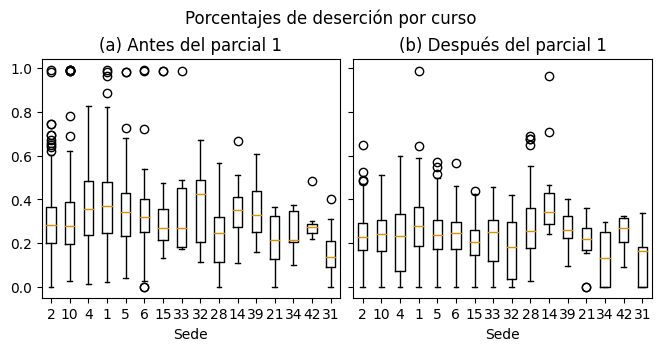

In [22]:
se = ['2', '10', '4', '1', '5', '6', '15', '33', '32', '28', '14', '39',
       '21', '34', '42', '31']
labels = se
x1 = [np.array(abandona1.loc[abandona1['SEDE'] == s]['abandona1_p']) for s in se]
x2 = [np.array(abandona2.loc[abandona2['SEDE'] == s]['abandona2_p']) for s in se]

fig, ax = plt.subplots(1, 2, figsize=(9, 4), sharey=True, layout='constrained')

bplot1 = ax[0].boxplot(x1,
                     vert=True,  # vertical box alignment
                    #  patch_artist=True,  # fill with color
                     labels=labels)  # will be used to label x-ticks

bplot2 = ax[1].boxplot(x2,
                     vert=True,  # vertical box alignment
                    #  patch_artist=True,  # fill with color
                     labels=labels)  # will be used to label x-ticks


ax[0].set_ylabel('')
ax[0].set_xlabel('Sede')
ax[0].set_title('(a) Antes del parcial 1')

ax[1].set_xlabel('Sede')
ax[1].set_title('(b) Después del parcial 1')

fig.suptitle('Porcentajes de deserción por curso')

if show:
    plt.show()
else:
    fig.set_size_inches(w=6.5, h=3.4)
    plt.savefig('../img/eda_02_box-desercion-cursos.pgf')

## Abandona entre parcial 1 y parcial 2

El análisis de esta sección está enfocado en el entrenamiento de modelos que estudien desgranamiento de los cursos.  

Se seleccionan los cursos válidos y las variables consistentes para ese análisis.

In [23]:
df = pd.read_csv("../datos/dataset_02-feateng.csv")
df['SEDE'] = df['SEDE'].astype('category')
df['sala'] = df['sala'].astype('category')
df['MATERIA'] = df['MATERIA'].astype('category')
df['cuat'] = df['cuat'].astype('category')
df['codCarrera'] = df['codCarrera'].astype('category')
df['facultad'] = df['facultad'].astype('category')
df['extranjero'] = df['extranjero'].astype('category')
df['edad'] = df['edad'].astype('category')
df['turno'] = df['turno'].astype('category')
df['recurso'] = df['recurso'].astype('category')
df = df.loc[(df['valido2']==1) & (df['condición'] != 'Abandona1')].copy()
print("Cantidad de observaciones: ",len(df),"\n")
# columnas que podrían se usadas para este análisis
df['objetivo'] = (df['condición'] == 'Abandona2').astype(int)
df['objetivo'] = df['objetivo'].astype('category')
columnas = ['cuat', 'SEDE', 'sala', 'MATERIA', 'pa1', 'pa1_prom', 'codCarrera',
        'facultad', 'extranjero', 'edad', 'prom_edad', 'turno', 'n_alum',
        'p_ext', 'recurso', 'p_recursa', 'abandona1_p', 'objetivo']
df = df[columnas]
df.info()

Cantidad de observaciones:  106987 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 106987 entries, 0 to 233614
Data columns (total 18 columns):
 #   Column       Non-Null Count   Dtype   
---  ------       --------------   -----   
 0   cuat         106987 non-null  category
 1   SEDE         106987 non-null  category
 2   sala         106987 non-null  category
 3   MATERIA      106987 non-null  category
 4   pa1          106765 non-null  float64 
 5   pa1_prom     106987 non-null  float64 
 6   codCarrera   106987 non-null  category
 7   facultad     106987 non-null  category
 8   extranjero   106987 non-null  category
 9   edad         106987 non-null  category
 10  prom_edad    106987 non-null  float64 
 11  turno        106987 non-null  category
 12  n_alum       106987 non-null  int64   
 13  p_ext        106987 non-null  float64 
 14  recurso      106987 non-null  category
 15  p_recursa    106987 non-null  float64 
 16  abandona1_p  106987 non-null  float64 
 17  objetivo   

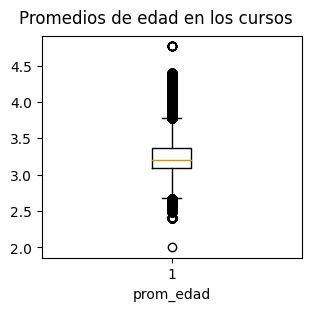

In [24]:
# Se detectan cursos con valores de prom_edad y p_ext outliers salvajes.
# El siguiente boxplot sirve como verificación si aparecen dichos outliers en el
# conjunto de datos actual.
x1 = [np.array(df['prom_edad'])]
fig, ax = plt.subplots(1, 1, figsize=(3, 3), layout='constrained')
bplot1 = ax.boxplot(x1,
                     vert=True,  # vertical box alignment
                    #  patch_artist=True,  # fill with color
                    )
ax.set_ylabel('')
ax.set_xlabel('prom_edad')
fig.suptitle('Promedios de edad en los cursos')
plt.show()

In [25]:
df.loc[df['prom_edad'] < 2.1]

,cuat,SEDE,sala,MATERIA,pa1,pa1_prom,codCarrera,facultad,extranjero,edad,prom_edad,turno,n_alum,p_ext,recurso,p_recursa,abandona1_p,objetivo
218033,2,31,139,3,5.0,5.0,90,INGENIERIA,0,2,2.0,A,1,0.0,0,0.0,0.0,0


In [26]:
# El outlier salvaje corresponde a un solo curso con un único estudiante
df = df.loc[df['prom_edad'] > 2.1]

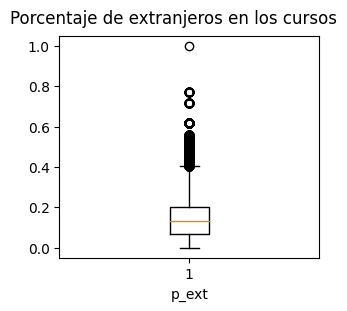

In [27]:
x1 = [np.array(df['p_ext'])]
fig, ax = plt.subplots(1, 1, figsize=(3, 3), layout='constrained')
bplot1 = ax.boxplot(x1,
                     vert=True,  # vertical box alignment
                    #  patch_artist=True,  # fill with color
                    )
ax.set_ylabel('')
ax.set_xlabel('p_ext')
fig.suptitle('Porcentaje de extranjeros en los cursos')
plt.show()

In [28]:
df.loc[df['p_ext'] >= 0.8]


,cuat,SEDE,sala,MATERIA,pa1,pa1_prom,codCarrera,facultad,extranjero,edad,prom_edad,turno,n_alum,p_ext,recurso,p_recursa,abandona1_p,objetivo
19803,2,21,117,3,2.0,2.0,11,CS EXACTAS Y NATURALES,1,4,4.0,C,1,1.0,0,0.0,0.0,0


In [29]:
df = df.loc[df['p_ext'] < 0.8]

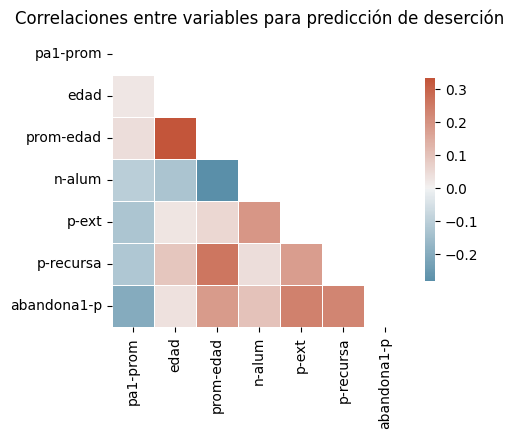

In [35]:
###################################
#
# Correlaciones
#
###################################

df['edad'] = df['edad'].astype('int')
corr = df[['pa1_prom', 'edad', 'prom_edad', 'n_alum', 'p_ext', 
        'p_recursa', 'abandona1_p']].corr()
# Es necesario corregir caracteres para no generar errores en Latex
corr.columns = ['pa1-prom', 'edad', 'prom-edad', 'n-alum', 'p-ext', 'p-recursa', 'abandona1-p']
corr.index = ['pa1-prom', 'edad', 'prom-edad', 'n-alum', 'p-ext', 'p-recursa', 'abandona1-p']

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(5, 5))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
# sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})
sns.heatmap(corr, mask=mask, cmap=cmap, robust=True, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5},
            ax=ax)
ax.set_title('Correlaciones entre variables para predicción de deserción')
plt.tight_layout()

if show:
    plt.show()
else:
    fig.set_size_inches(w=3, h=3)
    plt.savefig('../img/eda_02_correlaciones.pgf')




Hay algunas correlaciones esperables, pero son bajas.

Figuras motivadas a partir de los gráficos de pares de seaborn. Se ubican antes para no ejecutar los gráficos de pares, que pueden demorar varios minutos. 

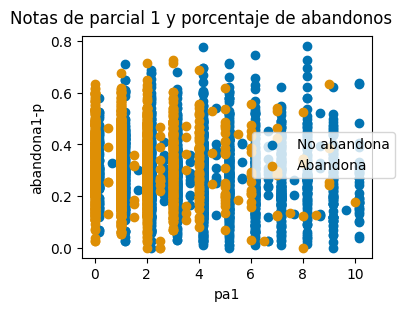

In [36]:
# Usar sample para bajar la cantidad de puntos,
# hay un límite para usar en Latex.
positivos = df.loc[df['objetivo'] == 1].sample(2000)
negativos = df.loc[df['objetivo'] == 0].sample(2000)
x0 = negativos['pa1'].values
# Correr un poco los valores en x para no superponer los puntos.
x0 = x0 + 0.15
y0 = negativos['abandona1_p'].values
x1 = positivos['pa1'].values
y1 = positivos['abandona1_p'].values

fig, ax = plt.subplots(figsize=(4.5, 4),layout='constrained')

plt.scatter(x0, y0, label="No abandona")
plt.scatter(x1, y1, label="Abandona")
ax.set_ylabel('abandona1-p')
ax.set_xlabel('pa1')
fig.suptitle('Notas de parcial 1 y porcentaje de abandonos')
fig.legend(loc="right")

if show:
    plt.show()
else:
    fig.set_size_inches(w=3.5, h=3)
    plt.savefig('../img/eda_02_pa1-abandona1.pgf')

Text(0.5, 0.98, 'Variables consistentes para analizar desgranamiento. Valores discriminados por materia.')

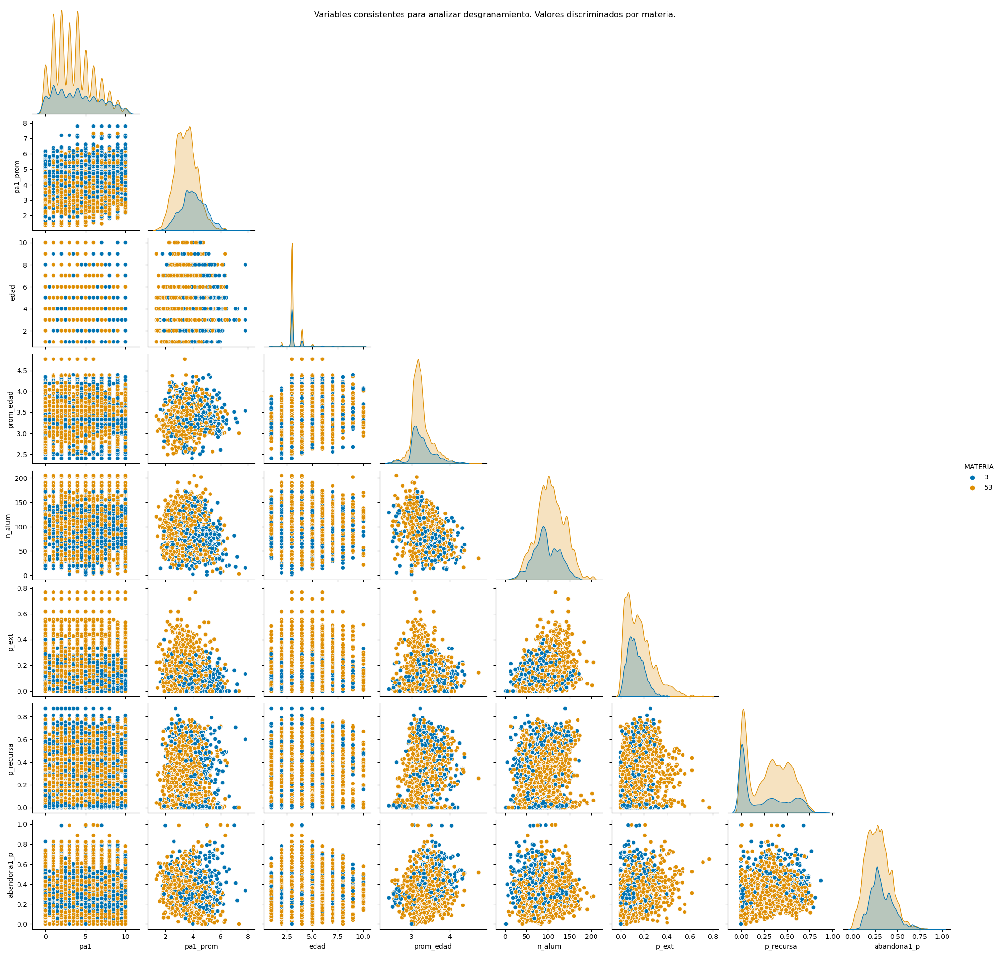

In [31]:
pairs = sns.pairplot(df, hue='MATERIA', corner=True)
pairs.fig.suptitle('Variables consistentes para analizar desgranamiento. Valores discriminados por materia.')

Text(0.5, 0.98, 'Variables consistentes para analizar desgranamiento. Valores discriminados por cuatrimestre.')

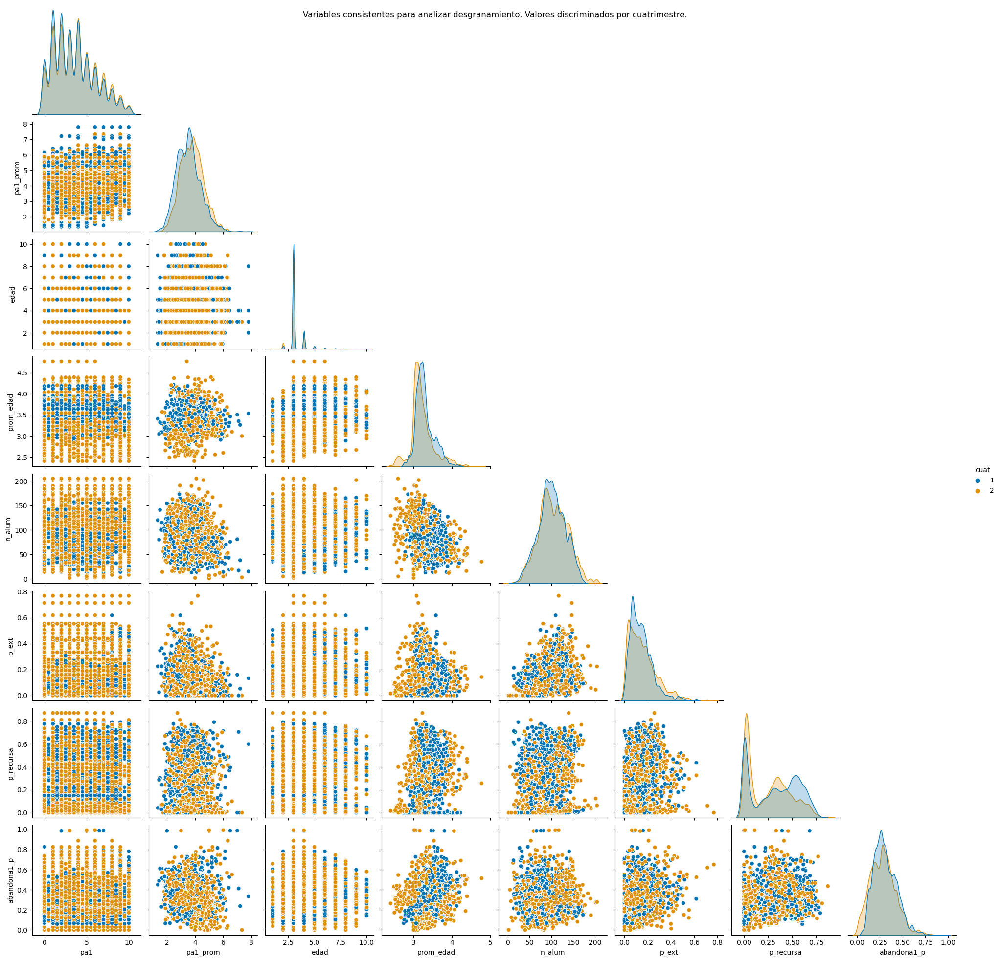

In [32]:
pairs = sns.pairplot(df, hue='cuat', corner=True)
pairs.fig.suptitle('Variables consistentes para analizar desgranamiento. Valores discriminados por cuatrimestre.')

Text(0.5, 0.98, 'Variables consistentes para analizar desgranamiento. Valores discriminados por sede.')

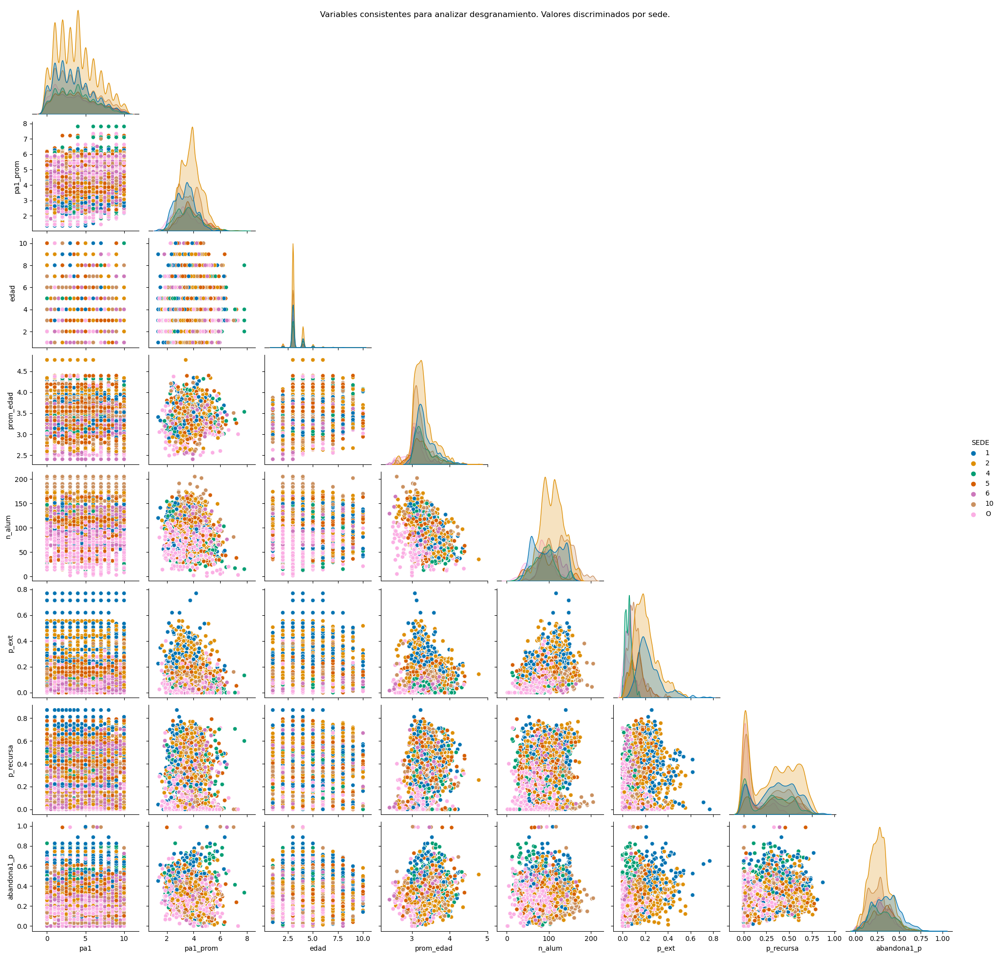

In [33]:
# Hay sedes grandes y otras (O)
df['SEDE'] = df['SEDE'].astype('str')
df.loc[~df['SEDE'].isin(['2','10','4','1','5','6']), 'SEDE'] = 'O'
pairs = sns.pairplot(df, hue='SEDE', corner=True)
pairs.fig.suptitle('Variables consistentes para analizar desgranamiento. Valores discriminados por sede.')

Text(0.5, 0.98, 'Variables consistentes para analizar desgranamiento. Valores discriminados por la variable objetivo.')

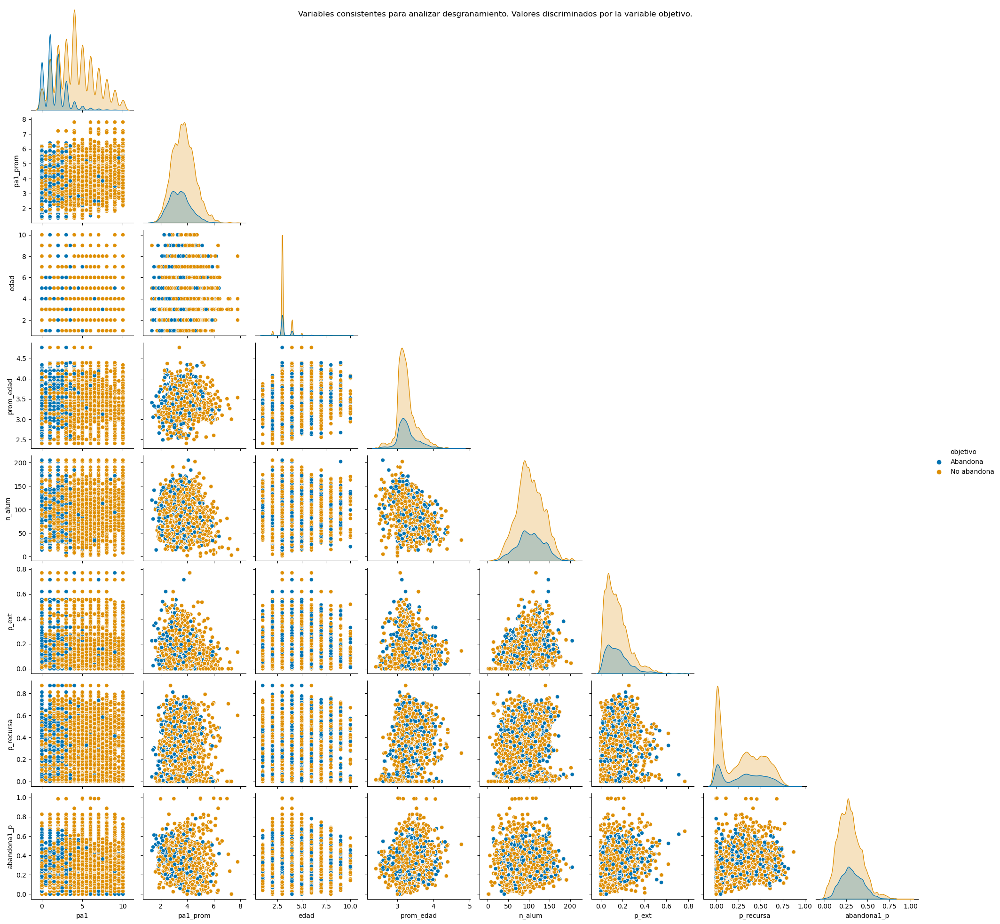

In [36]:
# Renombrar los valores de objetivo para una leyenda más clara
df2 = df.copy()
df2['objetivo'] = df2['objetivo'].astype('str')
df2.loc[df2['objetivo'] == '1', 'objetivo'] = 'Abandona'
df2.loc[df2['objetivo'] == '0', 'objetivo'] = 'No abandona'
pairs = sns.pairplot(df2, hue='objetivo', corner=True)
pairs.fig.suptitle('Variables consistentes para analizar desgranamiento. Valores discriminados por la variable objetivo.')

Como es de esperar, la mayor cantidad de estudiantes que abandona después de rendir el parcial 1 obtuvo una calificación baja en dicho parcial. El resto de las variables no demuestra discriminar el objetivo a simple vista.  

¿Qué sucede con los estudiantes que obtuvieron calificaciones altas en el primer parcial y no rinden el parcial 2?

In [36]:
df['SEDE'] = df['SEDE'].astype('str')
df.loc[~df['SEDE'].isin(['2','10','4','1','5','6']), 'SEDE'] = 'O'
df_altas = df.loc[(df['pa1'] > 3)].copy()
df_altas['objetivo'] = df_altas['objetivo'].astype('int')
print("\nCantidad de observaciones con notas > 3: ", len(df_altas))
print("Positivos/Total: ", round(df_altas.objetivo.sum()/len(df_altas),3))


Cantidad de observaciones con notas > 3:  51788
Positivos/Total:  0.042


Text(0.5, 0.98, 'Estudiantes con notas altas. Valores discriminados por la variable objetivo.')

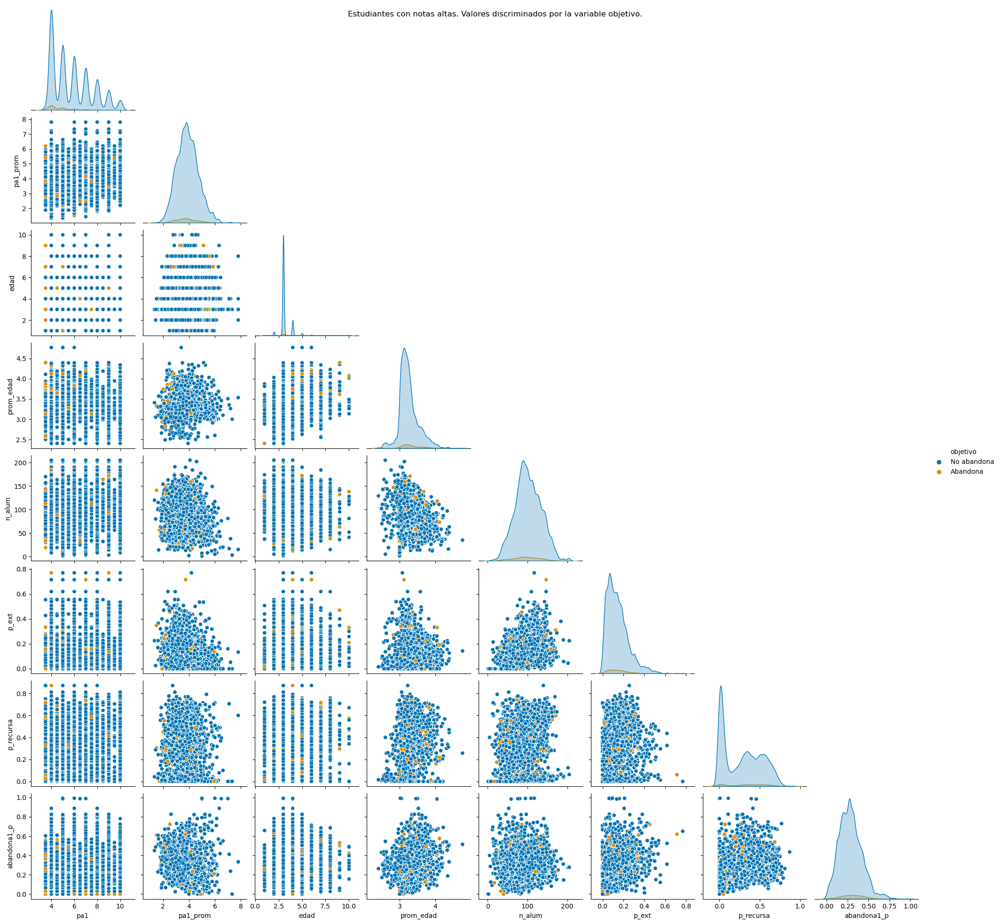

In [37]:
df2 = df_altas.copy()
df2['objetivo'] = df2['objetivo'].astype('str')
df2.loc[df2['objetivo'] == '1', 'objetivo'] = 'Abandona'
df2.loc[df2['objetivo'] == '0', 'objetivo'] = 'No abandona'
pairs = sns.pairplot(df2, hue='objetivo', corner=True)
pairs.fig.suptitle('Estudiantes con notas altas. Valores discriminados por la variable objetivo.')